In [1]:
import Pkg
Pkg.activate(".")
Pkg.status()

  Activating project at `~/VerifyNN/ModelVerification.jl`


Project ModelVerification v0.1.0
Status `~/VerifyNN/ModelVerification.jl/Project.toml`
⌃ [7d9f7c33] Accessors v0.1.36
⌃ [3391f64e] CDDLib v0.9.3
⌃ [336ed68f] CSV v0.10.14
⌅ [052768ef] CUDA v4.4.2
  [864edb3b] DataStructures v0.18.20
⌃ [e30172f5] Documenter v1.4.1
  [b7d42ee7] Einsum v0.4.1
⌃ [5789e2e9] FileIO v1.16.3
⌅ [587475ba] Flux v0.13.17
  [60bf3e95] GLPK v1.2.1
⌃ [82e4d734] ImageIO v0.6.8
  [916415d5] Images v0.26.1
  [a98d9a8b] Interpolations v0.15.1
⌃ [b6b21f68] Ipopt v1.6.3
⌅ [033835bb] JLD2 v0.4.48
⌅ [4076af6c] JuMP v1.5.0
⌅ [b4f0291d] LazySets v1.59.1
⌃ [b8f27783] MathOptInterface v1.30.0
⌅ [872c559c] NNlib v0.8.21
  [85610aed] NaiveNASflux v2.0.8 `onnx_parser/NaiveNASflux`
  [2e935253] ONNXNaiveNASflux v0.2.7 `onnx_parser/ONNXNaiveNASflux`
⌅ [f878e3a2] OpenCV v4.5.3
  [5432bcbf] PaddedViews v0.5.12
  [d96e819e] Parameters v0.12.3
  [ff2beb65] PicoSAT v0.4.1
⌃ [91a5bcdd] Plots v1.40.4
  [67491407] Polyhedra v0.7.8
⌃ [1e97bd63] ReachabilityAnalysis v0.21.0
  [ae029012] Requi

In [2]:
using ModelVerification, LazySets, Flux, LinearAlgebra, Parameters, MosekTools, Plots
import ModelVerification: prepare_problem, search_branches, ForwardProp, BackwardProp, ModelGraph
import ONNXNaiveNASflux
import NaiveNASflux

const MV = ModelVerification

ModelVerification

In [3]:
include("./vnncomp_scripts/vnnlib_parser.jl")

read_vnnlib_simple (generic function with 1 method)

# RIAI Example

In [88]:
toymodel = Chain(Dense(2 => 2, relu), Dense(2 => 2, relu), Dense(2 => 2)) |> f64

Chain(
  Dense(2 => 2, relu),                  # 6 parameters
  Dense(2 => 2, relu),                  # 6 parameters
  Dense(2 => 2),                        # 6 parameters
)                   # Total: 6 arrays, 18 parameters, 528 bytes.

In [89]:
toymodel[1].weight .= [1. 1; 1 -1]
toymodel[1].bias   .= [0., 0]
toymodel[2].weight .= [1. 1; 1 -1]
toymodel[2].bias   .= [-0.5, 0]
toymodel[3].weight .= [-1. 1; 0 1]
toymodel[3].bias   .= [3., 0];

In [90]:
X = -1. .+ 2 .* rand(2, 1000)  # sample 1000 random inputs in [-1, 1]
y = toymodel(X)

# show min/max for each output
extrema(y, dims=2)

2×1 Matrix{Tuple{Float64, Float64}}:
 (1.5223763706241638, 3.5)
 (0.0, 1.9593967896774713)

# Even Easier Model

In [4]:
toymodel = Chain(Dense(2 => 2, relu)) |> f64

toymodel[1].weight .= [1. 1; 1 -1]
toymodel[1].bias   .= [0., 0]

2-element Vector{Float64}:
 0.0
 0.0

In [5]:
X = -1. .+ 2 .* rand(2, 1000)  # sample 1000 random inputs in [-1, 1]
y = toymodel(X)

# show min/max for each output
extrema(y, dims=2)

2×1 Matrix{Tuple{Float64, Float64}}:
 (0.0, 1.9569516033126761)
 (0.0, 1.900474078420657)

# MIPVerify

In [7]:
search_method = BFS(max_iter=100, batch_size=1)
split_method = Bisect(1)
solver = MIPVerify(pre_bound_method=IBP())

MIPVerify
  optimizer: GLPK.Optimizer <: MathOptInterface.AbstractOptimizer
  pre_bound_method: IBP IBP()


Need `Complement()` in the output set, as `MIPVerify` works with a forbidden set in the output.
If the forbidden set can be reached, we have a violation, if not, the property holds.

In [8]:
input_set = Hyperrectangle(low=-ones(2), high=ones(2))
output_set = Complement(Hyperrectangle(low=[0.5, 0.], high=[4.5, 2]))

problem = Problem(toymodel, input_set, output_set)

Problem{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Complement{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}}("tmp.onnx", Chain(Dense(2 => 2, relu), Dense(2 => 2, relu), Dense(2 => 2)), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0.0], [1.0, 1.0]), Complement{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}(Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([2.5, 1.0], [2.0, 1.0])))

In [9]:
verify(search_method, split_method, solver, problem)

node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"
node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"


ModelVerification.ResultInfo(:violated, Dict{Any, Any}())

Why is this violated?

I thought, we are guaranteed to be in the output Hyperrectangle, so the complement can never be reached?

# Look into Internals

In [10]:
model_info, problem = prepare_problem(search_method, split_method, solver, problem)

(ModelGraph(["data_0"], ["dense_2"], ["data_0", "dense_0", "dense_0_relu", "dense_1", "dense_1_relu", "dense_2"], Dict{Any, Any}("dense_1_relu" => NNlib.relu, "dense_0_relu" => NNlib.relu, "dense_0" => Dense(2 => 2), "dense_2" => Dense(2 => 2), "dense_1" => Dense(2 => 2), "data_0" => identity), Dict{Any, Any}("dense_1_relu" => ["dense_1"], "dense_0_relu" => ["dense_0"], "dense_0" => Any["data_0"], "dense_2" => Any["dense_1_relu"], "dense_1" => Any["dense_0_relu"], "data_0" => Any[]), Dict{Any, Any}("dense_1_relu" => ["dense_2"], "dense_0_relu" => ["dense_1"], "dense_0" => ["dense_0_relu"], "dense_2" => Any[], "dense_1" => ["dense_1_relu"], "data_0" => ["dense_0"]), ["dense_0_relu", "dense_1_relu"], 0), Problem{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Complement{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}}("tmp.onnx", Chain(Dense(2 => 2, relu), Dense(2 => 2, relu), Dense(2 => 2)), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0

The method has signature `prepare_method(solver, batch_input, batch_output, batch_inheritance, model_info)`.

Since we have no batches for MILP, but the method requires vectors anyways, we just put everythin in a vector.

In [11]:
batch_output, batch_info = ModelVerification.prepare_method(solver, [problem.input], [problem.output], [nothing], model_info)

node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"


(Complement{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}[Complement{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}(Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([2.5, 1.0], [2.0, 1.0]))], Dict{Any, Any}("dense_1_relu" => Dict{Any, Any}(:pre_upper => [11.5, 8.0], :prev_nodes => ["dense_1"], :size_before_layer => (2, 1), :pre_lower => [-4.5, -8.0], :size_after_layer => (2, 1)), "dense_0_relu" => Dict{Any, Any}(:pre_upper => [4.0, 4.0], :prev_nodes => ["dense_0"], :size_before_layer => (2, 1), :pre_lower => [-4.0, -4.0], :size_after_layer => (2, 1)), "dense_0" => Dict{Any, Any}(:prev_nodes => Any["data_0"], :size_before_layer => (2, 1), :size_after_layer => (2, 1)), "dense_2" => Dict{Any, Any}(:prev_nodes => Any["dense_1_relu"], :size_before_layer => (2, 1), :size_after_layer => (2, 1)), :opt_model => A JuMP Model
Minimization problem with:
Variables: 3
Objective function type: JuMP.VariableRef
`JuMP.AffExpr`-in-`MathOptInterface.Gre

After `prepare_method()`, we 
- just pass through `batch_output` and additionally
- get a MIP model with constraints for input and output set.

Using the `propagate()` method, we build the MIP model for the networks layers.

In [12]:
batch_bound, batch_info = ModelVerification.propagate(solver, model_info, batch_info);

node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"


While `batch_bound` is just the input set of the problem, the `batch_info` is a dictionary containing
- the name of the current node
- for each node
    - the output set of the problem
    - the lower and upper bounds of the previous layer (if the node is a ReLU node)
    - the sizes of the concrete set before and after the layer
    - the name of the previous node
    - a dictionary containing the optimization variables
- the `JuMP` model and
- a reference to the objective function.

In [13]:
batch_info

Dict{Any, Any} with 9 entries:
  :current_node  => "dense_2"
  "dense_1_relu" => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  "dense_0_relu" => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  "dense_0"      => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  "dense_2"      => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  :opt_model     => A JuMP Model…
  "dense_1"      => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  "data_0"       => Dict{Any, Any}(:size_after_layer=>(2, 1), :prev_nodes=>Any[…
  :objective     => _[3]

In [14]:
batch_info["dense_1_relu"]

Dict{Any, Any} with 7 entries:
  :bound             => Hyperrectangle{Float64, Vector{Float64}, Vector{Float64…
  :pre_upper         => [11.5, 8.0]
  :prev_nodes        => ["dense_1"]
  :opt_vars          => Dict{Symbol, Vector{VariableRef}}(:δ=>[_[14], _[15]], :…
  :size_before_layer => (2, 1)
  :pre_lower         => [-4.5, -8.0]
  :size_after_layer  => (2, 1)

In [15]:
print(batch_info[:opt_model])

# Define own Optimizer

In [6]:
using SCS, JuMP

In [7]:
model = Model(SCS.Optimizer)

A JuMP Model
Feasibility problem with:
Variables: 0
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: SCS

The matrix $P = v v^T$ with $v = (1, \vec{x}, \vec{z})^T$ is used to describe the ReLU constraints.

In [8]:
n_neurons = 2
pre_act_inds = 2:2+n_neurons-1
post_act_inds = 2+n_neurons:2+2*n_neurons-1
@variable(model, P[1:1 + 2*n_neurons, 1:1 + 2*n_neurons], PSD)

5×5 Symmetric{VariableRef, Matrix{VariableRef}}:
 P[1,1]  P[1,2]  P[1,3]  P[1,4]  P[1,5]
 P[1,2]  P[2,2]  P[2,3]  P[2,4]  P[2,5]
 P[1,3]  P[2,3]  P[3,3]  P[3,4]  P[3,5]
 P[1,4]  P[2,4]  P[3,4]  P[4,4]  P[4,5]
 P[1,5]  P[2,5]  P[3,5]  P[4,5]  P[5,5]

In [9]:
@constraint(model, diag(P[post_act_inds, post_act_inds]) .== diag(P[pre_act_inds, post_act_inds]))

2-element Vector{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.EqualTo{Float64}}, ScalarShape}}:
 -P[2,4] + P[4,4] = 0.0
 -P[3,5] + P[5,5] = 0.0

In [10]:
@constraint(model, P[1,post_act_inds] .>= 0)
@constraint(model, P[1,post_act_inds] .>= P[1,pre_act_inds])

2-element Vector{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.GreaterThan{Float64}}, ScalarShape}}:
 -P[1,2] + P[1,4] ≥ 0.0
 -P[1,3] + P[1,5] ≥ 0.0

In [11]:
@constraint(model, P[1,1] .== 1)

P[1,1] = 1.0

Does it matter if we encode the input bounds constraints as quadratic constraints $(x-l)(x - u) \leq 0$ or linear constraints $x \geq l$, $x \leq u$?

## LayerSDP as Custom Solver

We try to reimplement the SDP encoding proposed in 

Batten et al.: *Efficient Neural Network Verification via Layer-based Semidefinite Relaxations and Linear Cuts*, IJCAI 21

First, we need to define the type for the new solver

In [12]:
@with_kw struct LayerSDP <: ForwardProp
    optimizer = SCS.Optimizer
    pre_bound_method::Union{ForwardProp, BackwardProp, Nothing} = nothing
end

LayerSDP

The `prepare_method()` sets up the layer-independent problem structure, i.e. just constraints for input and output and additional data structures/information needed by the solver.

(I.e. the `batch_info` dict contains the output sizes of each layer)

**TODO**:
- what is `init_propagation()`?
- `add_set_constraint()` for SDP (i.e. only bounds Constraints for `Hyperrectangle`)
- only have SDP constraint for unstable neurons (but matrix entries for all of them)
    - see [JuMP PSD constraints](https://jump.dev/JuMP.jl/stable/manual/constraints/#Semidefinite-constraints) and [JuMP Symmetric Variables](https://jump.dev/JuMP.jl/stable/manual/variables/#Symmetric-variables)
    - this may or may not be more efficient

In [13]:
function add_psd_input_set_constraint(opt_model, batch_info, start_node, input_set::AbstractHyperrectangle)
    # don't do anything, all the constraints will be handled in the first activation layer we encounter 
    # (or the last layer if no activation layer is found in the network)
    batch_info[start_node][:pre_lower] = low(input_set)
    batch_info[start_node][:pre_upper] = high(input_set)
end

add_psd_input_set_constraint (generic function with 1 method)

In [14]:
function MV.prepare_method(prop_method::LayerSDP, batch_input::AbstractVector, batch_output::AbstractVector,
                        batch_inheritance::AbstractVector, model_info::ModelGraph)::Tuple{AbstractVector, Dict}
    batch_info = MV.init_propagation(prop_method, batch_input, batch_output, model_info)
    
    # store :size_after_layer
    batch_info = MV.get_all_layer_output_size(model_info, batch_info, size(LazySets.center(batch_input[1])))

    # store previous nodes
    for node in model_info.all_nodes
        batch_info[node][:prev_nodes] = model_info.node_prevs[node]
    end

    # compute pre-activation bounds
    if !isnothing(prop_method.pre_bound_method)
        # compute bounds using specified method
        _, pre_batch_info = MV.prepare_method(
            prop_method.pre_bound_method, batch_input, batch_output, batch_inheritance, model_info)
        _, pre_batch_info = MV.propagate(prop_method.pre_bound_method, model_info, pre_batch_info)
        for node in model_info.activation_nodes
            @assert length(model_info.node_prevs[node]) == 1
            prev_node = model_info.node_prevs[node][1]
            pre_bound = pre_batch_info[prev_node][:bound]
            l, u = MV.compute_bound(pre_bound)
            # convert CUDA.CuArray to Vector for indexing in relu propagation
            batch_info[node][:pre_lower] = collect(l[:, 1])
            batch_info[node][:pre_upper] = collect(u[:, 1])
        end
    end
    #else
    #    # initialize bounds as sufficiently large intervals
    #    # but SDP really wouldn't need any bounds
    #    DEFAULT_PRE_ACT_BOUND = 1e4
    #    for node in model_info.activation_nodes
    #        @assert length(model_info.node_prevs[node]) == 1
    #        prev_node = model_info.node_prevs[node][1]
    #        prev_size = batch_info[prev_node][:size_after_layer][1]
    #        batch_info[node][:pre_lower] = fill(-DEFAULT_PRE_ACT_BOUND, prev_size)
    #        batch_info[node][:pre_upper] = fill(DEFAULT_PRE_ACT_BOUND, prev_size)
    #    end
    #end

    # create optimization model
    opt_model = Model(prop_method.optimizer)
    batch_info[:opt_model] = opt_model

    # create input variables and add constraints (suppose there is only one input)
    start_node = model_info.start_nodes[1]

    add_psd_input_set_constraint(opt_model, batch_info, start_node, batch_input[1])
    batch_info[start_node][:last_act_node] = start_node

    # objective function has to be added later
    # if we want to maximize violation, we first have to wait until the output layer
    # is encoded.

    return batch_output, batch_info
end

## Example Problem

We want to prove that the sum of the outputs of the RIAI model is bounded from above by $6.5$ (which should be true).
But we want to do it by maximizing the violation.

In [15]:
solver = LayerSDP(pre_bound_method=IBP())
search_method = BFS(max_iter=100, batch_size=1)  # actually not needed for SDP
split_method = Bisect(1)  # actually not needed for SDP

input_set = Hyperrectangle(low=-ones(2), high=ones(2))
output_set = HPolytope([1. 1.], [6.5])  # this or do we need the Complement(...)

problem = Problem(toymodel, input_set, output_set)

Problem{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, HPolytope{Float64, Vector{Float64}}}("tmp.onnx", Chain(Dense(2 => 2, relu)), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0.0], [1.0, 1.0]), HPolytope{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 1.0], 6.5)]))

In [16]:
model_info, problem = prepare_problem(search_method, split_method, solver, problem)

(ModelGraph(["data_0"], ["dense_0_relu"], ["data_0", "dense_0", "dense_0_relu"], Dict{Any, Any}("dense_0_relu" => NNlib.relu, "dense_0" => Dense(2 => 2), "data_0" => identity), Dict{Any, Any}("dense_0_relu" => ["dense_0"], "dense_0" => Any["data_0"], "data_0" => Any[]), Dict{Any, Any}("dense_0_relu" => Any[], "dense_0" => ["dense_0_relu"], "data_0" => ["dense_0"]), ["dense_0_relu"], 0), Problem{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, HPolytope{Float64, Vector{Float64}}}("tmp.onnx", Chain(Dense(2 => 2, relu)), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0.0], [1.0, 1.0]), HPolytope{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 1.0], 6.5)])))

In [17]:
batch_output, batch_info = MV.prepare_method(solver, [input_set], [output_set], [nothing], model_info)

node = "data_0"
node = "dense_0"
node = "dense_0_relu"


(HPolytope{Float64, Vector{Float64}}[HPolytope{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 1.0], 6.5)])], Dict{Any, Any}("dense_0_relu" => Dict{Any, Any}(:pre_upper => [4.0, 4.0], :prev_nodes => ["dense_0"], :size_before_layer => (2, 1), :pre_lower => [-4.0, -4.0], :size_after_layer => (2, 1)), "dense_0" => Dict{Any, Any}(:prev_nodes => Any["data_0"], :size_before_layer => (2, 1), :size_after_layer => (2, 1)), :opt_model => A JuMP Model
Feasibility problem with:
Variables: 0
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: SCS, "data_0" => Dict{Any, Any}(:size_after_layer => (2, 1), :pre_upper => [1.0, 1.0], :prev_nodes => Any[], :pre_lower => [-1.0, -1.0], :last_act_node => "data_0", :bound => Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}[Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0.0], [1.0, 1.0])])))

In [18]:
batch_info

Dict{Any, Any} with 4 entries:
  "dense_0_relu" => Dict{Any, Any}(:pre_upper=>[4.0, 4.0], :prev_nodes=>["dense…
  "dense_0"      => Dict{Any, Any}(:prev_nodes=>Any["data_0"], :size_before_lay…
  :opt_model     => A JuMP Model…
  "data_0"       => Dict{Any, Any}(:size_after_layer=>(2, 1), :pre_upper=>[1.0,…

In [19]:
batch_info["dense_1_relu"]

LoadError: KeyError: key "dense_1_relu" not found

In [20]:
batch_info["dense_1"]

LoadError: KeyError: key "dense_1" not found

In [21]:
batch_info["data_0"]

Dict{Any, Any} with 6 entries:
  :size_after_layer => (2, 1)
  :pre_upper        => [1.0, 1.0]
  :prev_nodes       => Any[]
  :pre_lower        => [-1.0, -1.0]
  :last_act_node    => "data_0"
  :bound            => Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}…

## Propagation through Layers


### Dense Layer

Just pass the weights and biases through to the activation layer.

**TODO**: Do we lose any precision, if we encode 
$$
\begin{align}
\hat{x} &= Wx + b\\
diag(P[yy^T]) &= diag(P[\hat{x}y^T])
\end{align}
$$
compared to encoding
$$
diag(P[yy^T] - WP[x y^T]) = b \odot P[y]
$$

If not, the first variant would be more modular for each layer type, but I'm not sure.

In [22]:
function MV.propagate_layer_batch(prop_method::LayerSDP, layer::Dense, bound::AbstractVector, batch_info::Dict)::AbstractVector
    # create optimization variable of the current node
    node = batch_info[:current_node]

    prev_nodes = batch_info[node][:prev_nodes]
    @assert length(prev_nodes) == 1
    prev_node = prev_nodes[1]
    if !haskey(batch_info[prev_node], :weight)
        batch_info[node][:weight] = layer.weight
        batch_info[node][:bias]   = layer.bias
    else
        # two chained linear layers
        W = batch_info[prev_node][:weight]
        b = batch_info[prev_node][:bias]
        batch_info[node][:weight] = layer.weight * W
        batch_info[node][:bias]   = layer.weight * b .+ layer.bias
    end

    batch_info[node][:last_act_node] = batch_info[prev_node][:last_act_node]

    return bound
end

### ReLU Layer

Here we do basically all of the layer-wise encoding.

In [23]:
function MV.propagate_layer_batch(prop_method::LayerSDP, layer::typeof(relu), bound::AbstractVector, batch_info::Dict)::AbstractVector
    # create optimization variable of the current node
    node = batch_info[:current_node]
    opt_model = batch_info[:opt_model]

    batch_info[node][:last_act_node] = node

    # get optimization variable of the previous actiation node
    # (since we don't really do anything in the linear layers)
    prev_nodes = batch_info[node][:prev_nodes]
    @assert length(prev_nodes) == 1
    prev_node = prev_nodes[1]
    prev_act_node = batch_info[prev_node][:last_act_node]

    n_neurons = batch_info[node][:size_after_layer][1]
    n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
    P = @variable(opt_model, [1:1 + n_neurons_prev + n_neurons, 1:1 + n_neurons_prev + n_neurons], PSD, base_name="P_$(node)")
    batch_info[node][:opt_vars] = Dict(:z => P)
    
    # idxs to access the previous and the last layer's entries in the matrix variable
    x_prev = 2:2+n_neurons_prev-1
    x      = 2+n_neurons_prev:2+n_neurons_prev+n_neurons-1

    W = batch_info[prev_node][:weight]
    b = batch_info[prev_node][:bias]

    if haskey(batch_info[node], :pre_lower)
        # get pre-activation bound
        l = batch_info[node][:pre_lower]
        u = batch_info[node][:pre_upper]

        # add constraint of relu layer
        active = l .>= 0.0
        inactive = u .<= 0.0
        unstable = .~active .& .~inactive

        # triangle ReLU upper bound
        λ, β = MV.relu_upper_bound(l[unstable], u[unstable])
        @constraint(opt_model, P[1,x[unstable]] .<= λ .* (W*P[1,x_prev] .+ b)[unstable] .+ β, base_name="relu_Δ_$(node)")
    else
        active = fill(false, n_neurons)
        inactive = fill(false, n_neurons)
        unstable = fill(true, n_neurons)
    end

    # fixed ReLUs
    # TODO: also constraints on quadratic vars here?
    # if y == Wx+b, then yy == (Wx + b)(Wx + b), xy == x(Wx + b)
    @constraint(opt_model, P[1,x[active]] .== (W*P[1,x_prev])[active,:] .+ b[active], base_name="fixed_active_$(node)")

    # TODO: does it help, if we also set x² == 0?
    # basically, we could just set all x == 0, xx == 0, xy == 0
    @constraint(opt_model, P[1,x[inactive]] .== 0.0, base_name="fixed_inactive_$(node)")

    # SDP relaxation
    @constraint(opt_model, P[1,x[unstable]] .>= 0.0, base_name="relu_geq_0_$(node)")
    @constraint(opt_model, P[1,x[unstable]] .>= (W*P[1,x_prev])[unstable,:] .+ b[unstable], base_name="relu_geq_x_$(node)")
    # y(y - (Wx+b)) == 0
    # yy - yWx - yb == 0
    # yy - W(xy') == yb
    @constraint(opt_model, diag(P[x[unstable],x[unstable]] .- (W*P[x_prev,x[unstable]])[unstable,:]) .== b[unstable] .* P[1,x[unstable]], base_name="relu_quad_$(node)")

    if haskey(batch_info[prev_act_node], :pre_lower)
        # only add bound constraints if we have bounds
        # i.e. always for the input layer
        l_prev = batch_info[prev_act_node][:pre_lower]
        u_prev = batch_info[prev_act_node][:pre_upper]

        # bound constraints
        # xx - (l + u)x + lu <= 0
        # xx - lx - ux + lu == (x - l)(x - u) <= 0
        @constraint(opt_model, diag(P[x_prev, x_prev]) .- (l_prev .+ u_prev) .* P[1,x_prev] .+ l_prev .* u_prev .<= 0, base_name="bounds_$(node)")
    end

    if haskey(batch_info[prev_act_node], :opt_vars)
        # connect this matrix var to the previous layer's matrix var
        # if the previous layer has no matrix variable, it might have
        # been the input layer.
        # We handled that by encoding the bounds on the variables above
        
        # TODO: rename to :z to :P ??    
        P_prev = batch_info[prev_act_node][:opt_vars][:z]
        
        # outputs of previous layer are at the end of the matrix var
        n_prev = size(P_prev, 1)
        x̂_prev = [1] ∪ (n_prev - (n_neurons_prev - 1):n_prev)
        x̂      = [1] ∪ x_prev
        @constraint(opt_model, P_prev[x̂_prev, x̂_prev] .== P[x̂, x̂], base_name="connect_$(node)")
    end

    @constraint(opt_model, P[1,1] == 1.)

    return bound
end

In [24]:
batch_bound, batch_info = MV.propagate(solver, model_info, batch_info);

node = "data_0"
node = "dense_0"
node = "dense_0_relu"


In [25]:
batch_info

Dict{Any, Any} with 5 entries:
  :current_node  => "dense_0_relu"
  "dense_0_relu" => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  "dense_0"      => Dict{Any, Any}(:bound=>Hyperrectangle{Float64, Vector{Float…
  :opt_model     => A JuMP Model…
  "data_0"       => Dict{Any, Any}(:size_after_layer=>(2, 1), :pre_upper=>[1.0,…

In [26]:
batch_bound

1-element Vector{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}:
 Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.0, 0.0], [1.0, 1.0])

In [27]:
print(batch_info[:opt_model])

In [28]:
opt_model = batch_info[:opt_model]

A JuMP Model
Feasibility problem with:
Variables: 15
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 3 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 4 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 4 constraints
`Vector{VariableRef}`-in-`MathOptInterface.PositiveSemidefiniteConeTriangle`: 1 constraint
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: SCS

In [29]:
batch_info[model_info.final_nodes[1]]

Dict{Any, Any} with 8 entries:
  :bound             => Hyperrectangle{Float64, Vector{Float64}, Vector{Float64…
  :pre_upper         => [4.0, 4.0]
  :prev_nodes        => ["dense_0"]
  :opt_vars          => Dict{Symbol, Symmetric{VariableRef, Matrix{VariableRef}…
  :size_before_layer => (2, 1)
  :pre_lower         => [-4.0, -4.0]
  :last_act_node     => "dense_0_relu"
  :size_after_layer  => (2, 1)

In [40]:
# minimize first output
c = [1., 0]  

final_node = model_info.final_nodes[1]
W = batch_info[final_node][:weight]
b = batch_info[final_node][:bias]

prev_act_node = batch_info[final_node][:last_act_node]
P = batch_info[prev_act_node][:opt_vars][:z]

n_prev = size(P, 1)
n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
x_prev = (n_prev - (n_neurons_prev - 1):n_prev)

@objective(opt_model, Min, c' * (W*P[1,x_prev] .+ b))

-P_dense_1_relu[1,4] + P_dense_1_relu[1,5] + 3

In [30]:
# minimize first output
c = [1., 0]  

final_node = model_info.final_nodes[1]
prev_act_node = batch_info[final_node][:last_act_node]
P = batch_info[prev_act_node][:opt_vars][:z]

n_prev = size(P, 1)
n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
x_prev = (n_prev - (n_neurons_prev - 1):n_prev)

@objective(opt_model, Min, c' * P[1,x_prev])

P_dense_0_relu[1,4]

In [31]:
optimize!(opt_model)

------------------------------------------------------------------
	       SCS v3.2.4 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
------------------------------------------------------------------
problem:  variables n: 15, constraints m: 26
cones: 	  z: primal zero / dual free vars: 3
	  l: linear vars: 8
	  s: psd vars: 15, ssize: 1
settings: eps_abs: 1.0e-04, eps_rel: 1.0e-04, eps_infeas: 1.0e-07
	  alpha: 1.50, scale: 1.00e-01, adaptive_scale: 1
	  max_iters: 100000, normalize: 1, rho_x: 1.00e-06
	  acceleration_lookback: 10, acceleration_interval: 10
	  compiled with openmp parallelization enabled
lin-sys:  sparse-direct-amd-qdldl
	  nnz(A): 38, nnz(P): 0
------------------------------------------------------------------
 iter | pri res | dua res |   gap   |   obj   |  scale  | time (s)
------------------------------------------------------------------
     0| 4.47e+00  2.92e-01  4.62e+00 -2.16e+00  1.00e-01  5.01e-03 
    50| 1.27e-05  3.34e-06  1.

In [32]:
solution_summary(opt_model, verbose=true)

* Solver : SCS

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Result count       : 1
  Has duals          : true
  Message from the solver:
  "solved"

* Candidate solution
  Objective value      : 1.27118e-05
  Dual objective value : 2.33751e-08
  Primal solution :
    P_dense_0_relu[1,1] : 1.00000e+00
    P_dense_0_relu[1,2] : -9.71461e-02
    P_dense_0_relu[1,3] : -5.00226e-02
    P_dense_0_relu[1,4] : 1.27118e-05
    P_dense_0_relu[1,5] : 3.32860e-02
    P_dense_0_relu[2,2] : 9.70341e-01
    P_dense_0_relu[2,3] : 5.26395e-01
    P_dense_0_relu[2,4] : 1.29360e+00
    P_dense_0_relu[2,5] : 2.05314e-02
    P_dense_0_relu[3,3] : 9.88526e-01
    P_dense_0_relu[3,4] : 1.52783e+00
    P_dense_0_relu[3,5] : -2.32244e-01
    P_dense_0_relu[4,4] : 2.82144e+00
    P_dense_0_relu[4,5] : -2.87524e-01
    P_dense_0_relu[5,5] : 2.52775e-01
  Dual solution :
    bounds_dense_0_relu : -0.00000e+00
    relu_geq_0_dense_0_relu : 

## RIAI Example

Now in one go, this time with Mosek.

In [127]:
input_set = Hyperrectangle(low=-ones(2), high=ones(2))
#input_set = Hyperrectangle(low=-ones(2), high=zeros(2))
output_set = HPolytope([1. 1.], [6.5])  # this or do we need the Complement(...)

problem = Problem(toymodel, input_set, output_set)

# adaptive slope is not implemented, see operators/relu.jl line 570
# solver = LayerSDP(optimizer=Mosek.Optimizer, pre_bound_method=Crown(use_gpu=false, bound_heuristics=MV.adaptive_slope))
# solver = LayerSDP(optimizer=Mosek.Optimizer, pre_bound_method=Crown(use_gpu=false, bound_heuristics=MV.parallel_slope))
solver = LayerSDP(optimizer=Mosek.Optimizer, pre_bound_method=nothing)

search_method = BFS(max_iter=100, batch_size=1)  # actually not needed for SDP
split_method = Bisect(1)  # actually not needed for SDP

model_info, problem = prepare_problem(search_method, split_method, solver, problem)
batch_output, batch_info = MV.prepare_method(solver, [input_set], [output_set], [nothing], model_info)
batch_bound, batch_info = MV.propagate(solver, model_info, batch_info);

node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"


In [128]:
# maximize first output
c = [1., 0]  

final_node = model_info.final_nodes[1]
W = batch_info[final_node][:weight]
b = batch_info[final_node][:bias]

prev_act_node = batch_info[final_node][:last_act_node]
P = batch_info[prev_act_node][:opt_vars][:z]

n_prev = size(P, 1)
n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
x_prev = (n_prev - (n_neurons_prev - 1):n_prev)

opt_model = batch_info[:opt_model]
@objective(opt_model, Max, c' * (W*P[1,x_prev] .+ b))

-P_dense_1_relu[1,4] + P_dense_1_relu[1,5] + 3

In [129]:
optimize!(opt_model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 25              
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 0               
  Matrix variables       : 2 (scalarized: 30)
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.00            
Lin. dep.  - primal attempts        : 1                 successes              : 1               
Lin. dep.  - dual attempts          : 0         

In [131]:
@objective(opt_model, Max, [0, 1.]' * (W*P[1,x_prev] .+ b))
optimize!(opt_model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 25              
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 0               
  Matrix variables       : 2 (scalarized: 30)
  Integer variables      : 0               

Optimizer started.
Optimizer terminated. Time: 0.00    



In [132]:
solution_summary(opt_model)

* Solver : Mosek

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Message from the solver:
  "Mosek.MSK_SOL_STA_OPTIMAL"

* Candidate solution
  Objective value      : 2.00000e+00
  Objective bound      : 2.00000e+00
  Relative gap         : 0.00000e+00
  Dual objective value : 2.00000e+00

* Work counters
  Solve time (sec)   : 1.71180e-03
  Simplex iterations : 0
  Barrier iterations : 10
  Node count         : 0


In [134]:
y_out = @variable(opt_model, [1:2])
@constraint(opt_model, y_out .== W*P[1,x_prev] .+ b)

2-element Vector{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.EqualTo{Float64}}, ScalarShape}}:
 P_dense_1_relu[1,4] - P_dense_1_relu[1,5] + _[33] = 3.0
 -P_dense_1_relu[1,5] + _[34] = 0.0

In [135]:
@objective(opt_model, Max, [1., 0]'*y_out)
optimize!(opt_model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 27              
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 4               
  Matrix variables       : 2 (scalarized: 30)
  Integer variables      : 0               

Optimizer started.
Optimizer terminated. Time: 0.00    



In [136]:
solution_summary(opt_model)

* Solver : Mosek

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Message from the solver:
  "Mosek.MSK_SOL_STA_OPTIMAL"

* Candidate solution
  Objective value      : 5.89043e+00
  Objective bound      : 5.89043e+00
  Relative gap         : 0.00000e+00
  Dual objective value : 5.89043e+00

* Work counters
  Solve time (sec)   : 2.34589e-03
  Simplex iterations : 0
  Barrier iterations : 10
  Node count         : 0


In [59]:
# maximize first output
c = [1., 0]  

final_node = model_info.final_nodes[1]
prev_act_node = batch_info[final_node][:last_act_node]
P = batch_info[prev_act_node][:opt_vars][:z]

n_prev = size(P, 1)
n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
x_prev = (n_prev - (n_neurons_prev - 1):n_prev)

opt_model = batch_info[:opt_model]
@objective(opt_model, Max, c' * P[1,x_prev])

P_dense_0_relu[1,4]

In [60]:
println(opt_model)

Max P_dense_0_relu[1,4]
Subject to
 relu_quad_dense_0_relu : -P_dense_0_relu[2,4] - P_dense_0_relu[3,4] + P_dense_0_relu[4,4] = 0.0
 relu_quad_dense_0_relu : -P_dense_0_relu[2,5] + P_dense_0_relu[3,5] + P_dense_0_relu[5,5] = 0.0
 P_dense_0_relu[1,1] = 1.0
 relu_geq_0_dense_0_relu : P_dense_0_relu[1,4] ≥ 0.0
 relu_geq_0_dense_0_relu : P_dense_0_relu[1,5] ≥ 0.0
 relu_geq_x_dense_0_relu : -P_dense_0_relu[1,2] - P_dense_0_relu[1,3] + P_dense_0_relu[1,4] ≥ 0.0
 relu_geq_x_dense_0_relu : -P_dense_0_relu[1,2] + P_dense_0_relu[1,3] + P_dense_0_relu[1,5] ≥ 0.0
 bounds_dense_0_relu : P_dense_0_relu[2,2] ≤ 1.0
 bounds_dense_0_relu : P_dense_0_relu[3,3] ≤ 1.0
 [P_dense_0_relu[1,1], P_dense_0_relu[1,2], P_dense_0_relu[2,2], P_dense_0_relu[1,3], P_dense_0_relu[2,3], P_dense_0_relu[3,3], P_dense_0_relu[1,4], P_dense_0_relu[2,4], P_dense_0_relu[3,4], P_dense_0_relu[4,4], P_dense_0_relu[1,5], P_dense_0_relu[2,5], P_dense_0_relu[3,5], P_dense_0_relu[4,5], P_dense_0_relu[5,5]] ∈ MathOptInterface.Positive

In [107]:
optimize!(opt_model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 25              
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 0               
  Matrix variables       : 2 (scalarized: 30)
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.00            
Lin. dep.  - primal attempts        : 1                 successes              : 1               
Lin. dep.  - dual attempts          : 0         

### LazySets Wrapper for JuMP Constraint Systems

`LazySets` can plot reachable sets, if the support vector function `LazySets.σ(a, set)`, i.e. the point $x$ in the set maximizing $a^T x$ is defined.
So we define it via a `JuMP` optimization problem.

In [38]:
# need dependence on N because just LazySet (without parametrisation on number datatype is not a type)
struct JuMPWrapper{N<:Number} <: LazySet{N}
    objfun  # original objective of the optimization problem
    model   # JuMP model containing the constraints
    outvars  # variables describing the current dim of the set
end

In [39]:
LazySets.dim(S::JuMPWrapper) = length(S.outvars)

In [40]:
function LazySets.σ(a::AbstractVector, S::JuMPWrapper)
    @objective(S.model, Max, a' * S.outvars)
    # can't use set_silent(), unset_silent() here,
    # somehow JuMP will complain that optimize! has not been called
    #set_silent(S.model)
    optimize!(S.model)
    #unset_silent(S.model)

    return value.(S.outvars)
end 

In [114]:
y_out = @variable(opt_model, [1:2], base_name="y")
@constraint(opt_model, y_out .== W*P[1,x_prev] .+ b)

jw = JuMPWrapper{Float64}(objective_function(opt_model), opt_model, y_out)

JuMPWrapper{Float64}(-P_dense_1_relu[1,4] + P_dense_1_relu[1,5] + 3, A JuMP Model
Maximization problem with:
Variables: 32
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 17 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 8 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 2 constraints
`Vector{VariableRef}`-in-`MathOptInterface.PositiveSemidefiniteConeTriangle`: 2 constraints
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: Mosek, VariableRef[y[1], y[2]])

In [61]:
y_out = @variable(opt_model, [1:2], base_name="y")
@constraint(opt_model, y_out .== P[1,x_prev])

jw = JuMPWrapper{Float64}(objective_function(opt_model), opt_model, y_out)

JuMPWrapper{Float64}(P_dense_0_relu[1,4], A JuMP Model
Maximization problem with:
Variables: 17
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 5 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 4 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 2 constraints
`Vector{VariableRef}`-in-`MathOptInterface.PositiveSemidefiniteConeTriangle`: 1 constraint
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: Mosek, VariableRef[y[1], y[2]])

In [62]:
print(opt_model)

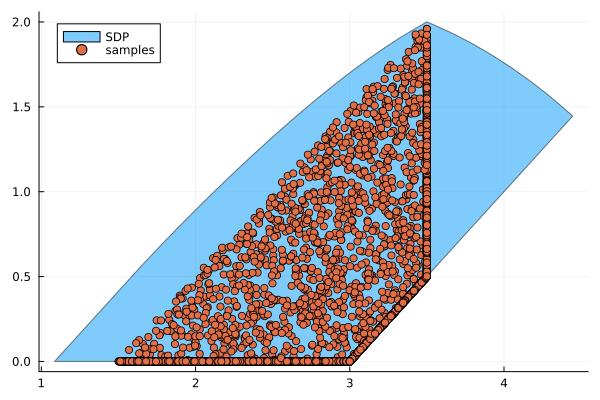

In [117]:
n_samples = 10000

set_silent(jw.model)
plot(jw, label="SDP")
unset_silent(jw.model)

xs = sample(input_set, n_samples)
xs = hcat(xs...)

ys = toymodel(xs)
scatter!(ys[1,:], ys[2,:], label="samples")

In [126]:
@objective(jw.model, Max, [1.14, -4.5]'*jw.outvars)
optimize!(jw.model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 27              
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 2               
  Matrix variables       : 2 (scalarized: 30)
  Integer variables      : 0               

Optimizer started.
Optimizer terminated. Time: 0.00    



In [125]:
solution_summary(jw.model)

* Solver : Mosek

* Status
  Termination status : OPTIMAL
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Message from the solver:
  "Mosek.MSK_SOL_STA_OPTIMAL"

* Candidate solution
  Objective value      : 1.08579e+00
  Objective bound      : 1.08579e+00
  Relative gap         : 0.00000e+00
  Dual objective value : 1.08579e+00

* Work counters
  Solve time (sec)   : 2.90883e-03
  Simplex iterations : 0
  Barrier iterations : 13
  Node count         : 0


In [82]:
@variable(model, P[1:5,1:5], PSD)

@constraint(model, diag(P[2:3, 2:3]) .- (-1. .+ 1) .* P[1,2:3] .+ (-1.) .* 1. .<= 0)
@constraint(model, P[1,1] .== 1.)

@variable(model, y[1:2])
@constraint(model, y .== [1. 1; 1 -1]*P[1,2:3])

jw = JuMPWrapper{Float64}(objective_function(model), model, y)

print(model)

In [83]:
model2 = Model(Mosek.Optimizer)

@variable(model2, P[1:5,1:5], PSD)

@constraint(model2, diag(P[2:3, 2:3]) .- (-1. .+ 1) .* P[1,2:3] .+ (-1.) .* 1. .<= 0)
@constraint(model2, P[1,1] .== 1.)

W = [1. 1; 1 -1]

@constraint(model2, P[1,4:5] .>= 0.0)
@constraint(model2, P[1,4:5] .>= W*P[1,2:3])
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model2, diag(P[4:5,4:5] .- W*P[2:3,4:5]) .== 0)

@variable(model2, y[1:2])
@constraint(model2, y .== P[1,4:5])

jw2 = JuMPWrapper{Float64}(objective_function(model2), model2, y)

print(model2)

In [84]:
model3 = Model(Mosek.Optimizer)

@variable(model3, P[1:5,1:5], PSD)

@constraint(model3, diag(P[2:3, 2:3]) .- (-1. .+ 1) .* P[1,2:3] .+ (-1.) .* 1. .<= 0)
@constraint(model3, P[1,1] .== 1.)

W = [1. 1; 1 -1]
b = [-0.5, 0]

@constraint(model3, P[1,4:5] .>= 0.0)
@constraint(model3, P[1,4:5] .>= W*P[1,2:3])
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model3, diag(P[4:5,4:5] .- W*P[2:3,4:5]) .== 0)


# next layer
@variable(model3, Q[1:5, 1:5], PSD)
@constraint(model3, Q[1,1] .== 1)

@constraint(model3, Q[1:3,1:3] .== P[[1,4,5],[1,4,5]])

@variable(model3, y[1:2])
@constraint(model3, y .== W*Q[1,2:3] .+ b)

jw3 = JuMPWrapper{Float64}(objective_function(model3), model3, y)

print(model3)

In [85]:
model4 = Model(Mosek.Optimizer)

@variable(model4, P[1:5,1:5], PSD)

@constraint(model4, diag(P[2:3, 2:3]) .- (-1. .+ 1) .* P[1,2:3] .+ (-1.) .* 1. .<= 0)
@constraint(model4, P[1,1] .== 1.)

W = [1. 1; 1 -1]
b = [-0.5, 0]

@constraint(model4, P[1,4:5] .>= 0.0)
@constraint(model4, P[1,4:5] .>= W*P[1,2:3])
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model4, diag(P[4:5,4:5] .- W*P[2:3,4:5]) .== 0)


# next layer
@variable(model4, Q[1:5, 1:5], PSD)
@constraint(model4, Q[1,1] .== 1)

@constraint(model4, Q[1,4:5] .>= 0.0)
@constraint(model4, Q[1,4:5] .>= W*Q[1,2:3] .+ b)
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model4, diag(Q[4:5,4:5] .- W*Q[2:3,4:5]) .== b .* Q[1,4:5])

# consistency
@constraint(model4, Q[1:3,1:3] .== P[[1,4,5],[1,4,5]])

@variable(model4, y[1:2])
@constraint(model4, y .== Q[1,4:5])

jw4 = JuMPWrapper{Float64}(objective_function(model4), model4, y)

print(model4)

In [86]:
model5 = Model(Mosek.Optimizer)

@variable(model5, P[1:5,1:5], PSD)

@constraint(model5, diag(P[2:3, 2:3]) .- (-1. .+ 1) .* P[1,2:3] .+ (-1.) .* 1. .<= 0)
@constraint(model5, P[1,1] .== 1.)

W = [1. 1; 1 -1]
b = [-0.5, 0]

@constraint(model5, P[1,4:5] .>= 0.0)
@constraint(model5, P[1,4:5] .>= W*P[1,2:3])
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model5, diag(P[4:5,4:5] .- W*P[2:3,4:5]) .== 0)


# next layer
@variable(model5, Q[1:5, 1:5], PSD)
@constraint(model5, Q[1,1] .== 1)

@constraint(model5, Q[1,4:5] .>= 0.0)
@constraint(model5, Q[1,4:5] .>= W*Q[1,2:3] .+ b)
# y(y - (Wx+b)) == 0
# yy - yWx - yb == 0
# yy - W(xy') == yb
@constraint(model5, diag(Q[4:5,4:5] .- W*Q[2:3,4:5]) .== b .* Q[1,4:5])

# consistency
@constraint(model5, Q[1:3,1:3] .== P[[1,4,5],[1,4,5]])

@variable(model5, y[1:2])
@constraint(model5, y .== [-1. 1; 0 1]*Q[1,4:5] .+ [3., 0])

jw5 = JuMPWrapper{Float64}(objective_function(model5), model5, y)

print(model5)

In [93]:
y_out = @variable(opt_model, [1:2], base_name="y")
@constraint(opt_model, y_out .== W*P[1,x_prev] .+ b)

jw_out = JuMPWrapper{Float64}(objective_function(opt_model), opt_model, y_out)

JuMPWrapper{Float64}(-P_dense_1_relu[1,4] + P_dense_1_relu[1,5] + 3, A JuMP Model
Maximization problem with:
Variables: 32
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 17 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 8 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 2 constraints
`Vector{VariableRef}`-in-`MathOptInterface.PositiveSemidefiniteConeTriangle`: 2 constraints
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: Mosek, VariableRef[y[1], y[2]])

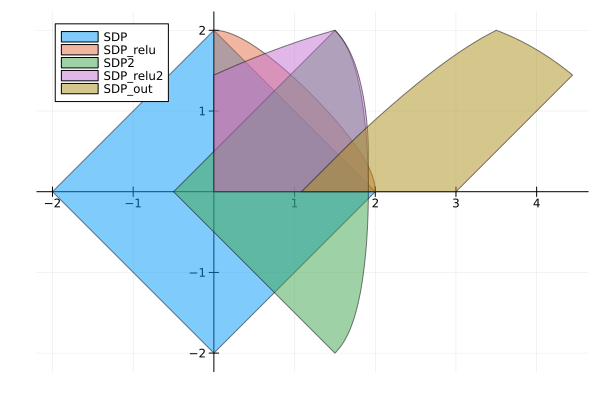

In [96]:
set_silent(jw.model)
plot(jw, framestyle=:origin, aspect_ratio=:equal, label="SDP")
unset_silent(jw.model)

set_silent(jw2.model)
plot!(jw2, label="SDP_relu")
unset_silent(jw2.model)

set_silent(jw3.model)
plot!(jw3, label="SDP2")
unset_silent(jw3.model)

set_silent(jw4.model)
plot!(jw4, label="SDP_relu2")
unset_silent(jw4.model)

set_silent(jw5.model)
plot!(jw5, label="SDP3")
unset_silent(jw5.model)

set_silent(jw_out.model)
plot!(jw_out, label="SDP_out")
unset_silent(jw_out.model)

current()

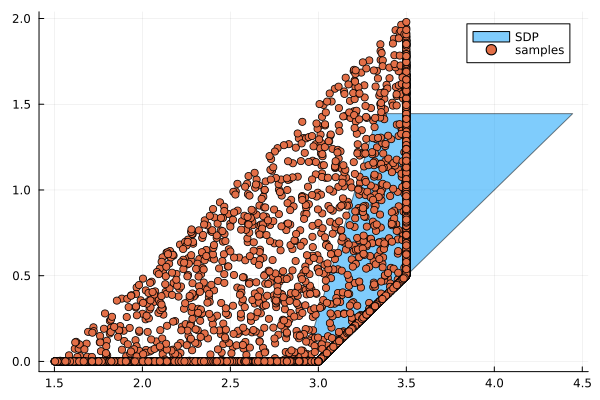

In [222]:
n_samples = 10000

set_silent(jw.model)
plot(jw, label="SDP")
unset_silent(jw.model)

xs = sample(input_set, n_samples)
xs = hcat(xs...)

ys = toymodel(xs)
scatter!(ys[1,:], ys[2,:], label="samples")

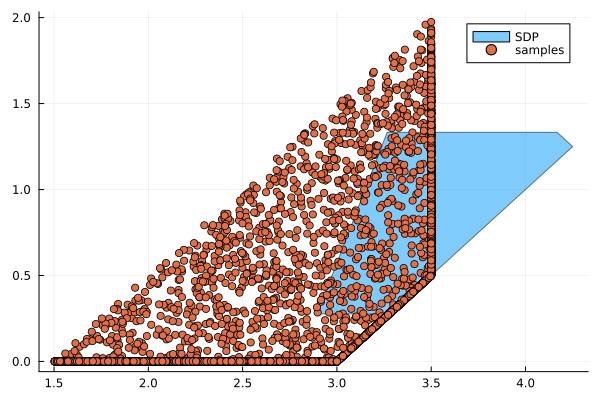

In [232]:
n_samples = 10000

set_silent(jw.model)
plot(jw, label="SDP")
unset_silent(jw.model)

xs = sample(input_set, n_samples)
xs = hcat(xs...)

ys = toymodel(xs)
scatter!(ys[1,:], ys[2,:], label="samples")

## ACAS

In [150]:
# currently needs the _simple.onnx models, as it seems to not do constant folding and takes the constants as further inputs
net = MV.build_flux_model("../vnncomp2022_benchmarks/benchmarks/acasxu/onnx/ACASXU_run2a_1_1_batch_2000_simple.onnx")

removing starting flatten


Chain(
  Dense(5 => 50, relu),                 # 300 parameters
  Dense(50 => 50, relu),                # 2_550 parameters
  Dense(50 => 50, relu),                # 2_550 parameters
  Dense(50 => 50, relu),                # 2_550 parameters
  Dense(50 => 50, relu),                # 2_550 parameters
  Dense(50 => 50, relu),                # 2_550 parameters
  Dense(50 => 5),                       # 255 parameters
)                   # Total: 14 arrays, 13_305 parameters, 52.848 KiB.

In [171]:
specs = read_vnnlib_simple("../vnncomp2022_benchmarks/benchmarks/acasxu/vnnlib/prop_1.vnnlib", 5, 5)

X_range, Y_cons = specs[1]
lb = [bd[1] for bd in X_range]
ub = [bd[2] for bd in X_range]

Y_con = Y_cons[1]

input_set = Hyperrectangle(low=lb, high=ub)
input_set = Hyperrectangle(input_set.center, 0.1 .* input_set.radius)
A = hcat(Y_con[1]...)'
b = Y_con[2]

Yc = HPolytope(A, b)
Y  = Complement(Yc)

problem = Problem(net, input_set, Y)

Problem{Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Complement{Float64, HPolytope{Float64, Vector{Float64}}}}("tmp.onnx", Chain(Dense(5 => 50, relu), Dense(50 => 50, relu), Dense(50 => 50, relu), Dense(50 => 50, relu), Dense(50 => 50, relu), Dense(50 => 50, relu), Dense(50 => 5)), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.6399288845, 0.0, 0.0, 0.475, -0.475], [0.003992888449999998, 0.05, 0.05, 0.0025000000000000022, 0.002499999999999997]), Complement{Float64, HPolytope{Float64, Vector{Float64}}}(HPolytope{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([-1.0, 0.0, 0.0, 0.0, 0.0], -3.991125645861615)])))

In [172]:
solver = LayerSDP(optimizer=Mosek.Optimizer, pre_bound_method=Crown(use_gpu=false, bound_heuristics=MV.parallel_slope))
search_method = BFS(max_iter=100, batch_size=1)  # actually not needed for SDP
split_method = Bisect(1)  # actually not needed for SDP

model_info, problem = prepare_problem(search_method, split_method, solver, problem)
batch_output, batch_info = MV.prepare_method(solver, [input_set], [output_set], [nothing], model_info)
batch_bound, batch_info = MV.propagate(solver, model_info, batch_info);

node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"
node = "dense_2_relu"
node = "dense_3"
node = "dense_3_relu"
node = "dense_4"
node = "dense_4_relu"
node = "dense_5"
node = "dense_5_relu"
node = "dense_6"
node = "data_0"
node = "dense_0"
node = "dense_0_relu"
node = "dense_1"
node = "dense_1_relu"
node = "dense_2"
node = "dense_2_relu"
node = "dense_3"
node = "dense_3_relu"
node = "dense_4"
node = "dense_4_relu"
node = "dense_5"
node = "dense_5_relu"
node = "dense_6"


In [173]:
# maximize first output
c = zeros(5)
c[1] = 1.

final_node = model_info.final_nodes[1]
W = batch_info[final_node][:weight]
b = batch_info[final_node][:bias]

prev_act_node = batch_info[final_node][:last_act_node]
P = batch_info[prev_act_node][:opt_vars][:z]

n_prev = size(P, 1)
n_neurons_prev = batch_info[prev_act_node][:size_after_layer][1]
x_prev = (n_prev - (n_neurons_prev - 1):n_prev)

opt_model = batch_info[:opt_model]
@objective(opt_model, Max, c' * (W*P[1,x_prev] .+ b))

-0.001004899968393147 P_dense_5_relu[1,52] + 0.017758799716830254 P_dense_5_relu[1,53] + 0.006446839775890112 P_dense_5_relu[1,54] + 0.010059799998998642 P_dense_5_relu[1,55] + 0.0021575100254267454 P_dense_5_relu[1,56] + 0.024169500917196274 P_dense_5_relu[1,57] + 0.020716000348329544 P_dense_5_relu[1,58] + 0.003253479953855276 P_dense_5_relu[1,59] + 0.03769569844007492 P_dense_5_relu[1,60] + 0.0537382997572422 P_dense_5_relu[1,61] + 0.0039666700176894665 P_dense_5_relu[1,62] + 0.0002951709902845323 P_dense_5_relu[1,63] + 0.008441179990768433 P_dense_5_relu[1,64] + 0.004300479777157307 P_dense_5_relu[1,65] + 5.535460149985738e-5 P_dense_5_relu[1,66] + 0.027062799781560898 P_dense_5_relu[1,67] + 0.004229830112308264 P_dense_5_relu[1,68] - 0.01696060039103031 P_dense_5_relu[1,69] + 0.004339979961514473 P_dense_5_relu[1,70] + 0.05675249919295311 P_dense_5_relu[1,71] + 0.060024701058864594 P_dense_5_relu[1,72] + 0.03470969945192337 P_dense_5_relu[1,73] + 0.0010463399812579155 P_dense_5_re

In [174]:
opt_model

A JuMP Model
Maximization problem with:
Variables: 27351
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 13311 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 366 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 438 constraints
`Vector{VariableRef}`-in-`MathOptInterface.PositiveSemidefiniteConeTriangle`: 6 constraints
Model mode: AUTOMATIC
CachingOptimizer state: EMPTY_OPTIMIZER
Solver name: Mosek

In [175]:
optimize!(opt_model)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 14115           
  Affine conic cons.     : 0               
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 0               
  Matrix variables       : 6 (scalarized: 27351)
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.00            
Lin. dep.  - primal attempts        : 1                 successes              : 1               
Lin. dep.  - dual attempts          : 0      

In [176]:
solution_summary(opt_model)

* Solver : Mosek

* Status
  Termination status : INFEASIBLE
  Primal status      : NO_SOLUTION
  Dual status        : INFEASIBILITY_CERTIFICATE
  Message from the solver:
  "Mosek.MSK_SOL_STA_PRIM_INFEAS_CER"

* Candidate solution
  Objective value      : 3.26211e-14
  Objective bound      : 3.26211e-14
  Relative gap         : 0.00000e+00
  Dual objective value : -8.06327e-01

* Work counters
  Solve time (sec)   : 7.93972e+01
  Simplex iterations : 0
  Barrier iterations : 12
  Node count         : 0


In [189]:
constraints = all_constraints(opt_model, include_variable_in_set_constraints=false)

for con in constraints
    if dual(con) > 1
        println(dual, ": ", dual(con), " - ", con)
    end
end

dual: 2.5417873810668565 - fixed_active_dense_0_relu : -0.4020020067691803 P_dense_0_relu[1,2] - 0.2240220010280609 P_dense_0_relu[1,3] + 0.04671600088477135 P_dense_0_relu[1,4] - 0.16389000415802002 P_dense_0_relu[1,5] + 0.16082599759101868 P_dense_0_relu[1,6] + P_dense_0_relu[1,13] = 0.0746065005660057
dual: 2.1857093880544287 - fixed_active_dense_0_relu : -0.03201799839735031 P_dense_0_relu[1,2] - 0.4224550127983093 P_dense_0_relu[1,3] + 0.5688329935073853 P_dense_0_relu[1,4] + 0.2107820063829422 P_dense_0_relu[1,5] - 0.07575059682130814 P_dense_0_relu[1,6] + P_dense_0_relu[1,21] = 0.1969289928674698
dual: 2.397532253091455 - fixed_active_dense_0_relu : -0.01668659970164299 P_dense_0_relu[1,2] + 0.6544049978256226 P_dense_0_relu[1,3] - 0.560096025466919 P_dense_0_relu[1,4] - 0.1965789943933487 P_dense_0_relu[1,5] + 0.44980499148368835 P_dense_0_relu[1,6] + P_dense_0_relu[1,30] = 0.009832659736275673
dual: 2.2718588645495417 - fixed_active_dense_0_relu : -0.16033299267292023 P_dense_

LoadError: MethodError: no method matching isless(::Int64, ::Vector{Float64})

[0mClosest candidates are:
[0m  isless(::Union{Number, Dates.AbstractTime}, [91m::IntervalSets.ClosedInterval[39m)
[0m[90m   @[39m [35mAxisArrays[39m [90m~/.julia/packages/AxisArrays/CtyI0/src/[39m[90m[4mintervals.jl:53[24m[39m
[0m  isless([91m::AbstractVector[39m, ::AbstractVector)
[0m[90m   @[39m [90mBase[39m [90m[4mabstractarray.jl:2913[24m[39m
[0m  isless(::Real, [91m::AbstractGray[39m)
[0m[90m   @[39m [36mColorTypes[39m [90m~/.julia/packages/ColorTypes/vpFgh/src/[39m[90m[4moperations.jl:39[24m[39m
[0m  ...


In [177]:
dual_status(opt_model)

INFEASIBILITY_CERTIFICATE::ResultStatusCode = 4

In [178]:
primal_status(opt_model)

NO_SOLUTION::ResultStatusCode = 0

In [160]:
compute_conflict!(opt_model)

LoadError: ArgumentError: The optimizer MosekTools.Optimizer does not support `compute_conflict!`

`vnnlib` files generally specify an **unsafe set**, which gets packed into a `Complement`.

If we can reach the complement, i.e. if $x \in \mathcal{X} \wedge y = NN(x) \wedge y \in \mathcal{Y}$ is satisfiable, the spec is violated.

If the unsafe set consisted of multiple linear inequalities, we need to check them one by one.

In [ ]:
function process_bound(prop_method::LayerSDP, batch_bound::AbstractArray, batch_out_spec::AbstractArray,
                       model_info::ModelGraph, batch_info::Dict)::Tuple{Vector{Hyperrectangle}, Dict}
    opt_model = batch_info[:opt_model]
    final_node = model_info.final_nodes[1]

    prev_nodes = batch_info[node][:prev_nodes]
    @assert length(prev_nodes) == 1
    prev_node = prev_nodes[1]
    prev_act_node = batch_info[prev_node][:last_act_node]
    
    P = batch_info[prev_act_node][:opt_vars][:z]

    # W = I, b = 0
    # if last layer has weights, then just use those as W and b
    # then optimize c' P[1, x_out]
    

    function get_max_disturbance()
        if termination_status(opt_model) == OPTIMAL
            max_disturbance = value(batch_info[:objective])
            # counterexample is available but is nowhere to return
            counterexample = value.(batch_info[model_info.start_nodes[1]][:opt_vars][:z])
        else
            max_disturbance = Inf
        end
        return max_disturbance
    end

    # add output constraints (suppose there is only one output)
    if batch_out_spec[1] isa Complement
        # constraint is convex, solve one optimization problem
        add_set_constraint(opt_model, z, batch_out_spec[1].X)
        optimize!(opt_model)
        max_disturbance = get_max_disturbance()
    else
        # constraint is not convex, split into `n` Hyperplanes and solve `n` optimization problems
        A, b = tosimplehrep(batch_out_spec[1])
        max_disturbance = Inf
        output_constraint = nothing
        for i in axes(A, 1)
            if i > 1
                JuMP.delete(opt_model, output_constraint)
                JuMP.unregister(opt_model, :output_constraint)
            end
            @constraint(opt_model, output_constraint, dot(A[i, :], z) >= b[i])
            optimize!(opt_model)
            max_disturbance = min(get_max_disturbance(), max_disturbance)
            # property is violated as long as one counterexample is found
            if max_disturbance != Inf
                break
            end
        end
    end
    # ensure disturbance is non-negative in case of numerical errors
    max_disturbance = max(max_disturbance, 0.0)

    # wrap maximum disturbance as a Hyperrectangle for type consistency
    batch_bound = [Hyperrectangle([0.0], [max_disturbance])]

    return batch_bound, batch_info
end